(2866, 2944)


C:\Program Files\Python39\lib\site-packages\scipy\signal\_signaltools.py:1629: RuntimeWarning: divide by zero encountered in divide
  res *= (1 - noise / lVar)
C:\Program Files\Python39\lib\site-packages\scipy\signal\_signaltools.py:1629: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2920.1379192905333
0.019116960385164628
(5731, 5887)
Координаты центра
Количество
195939

(500, 500, 3)


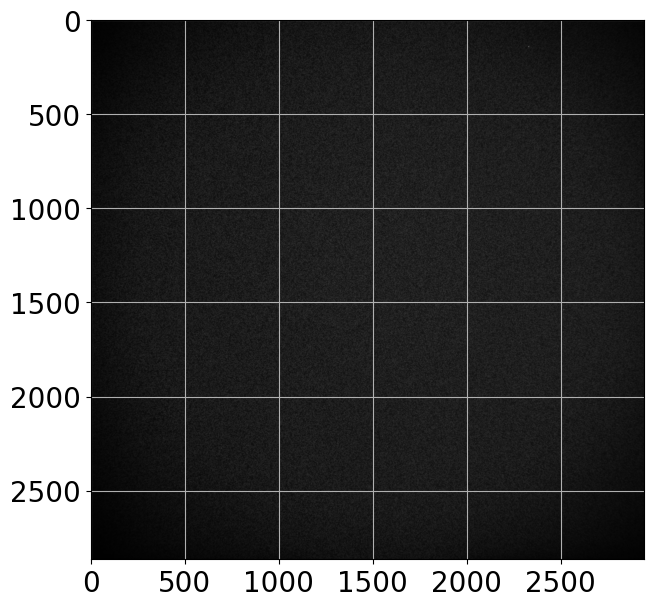

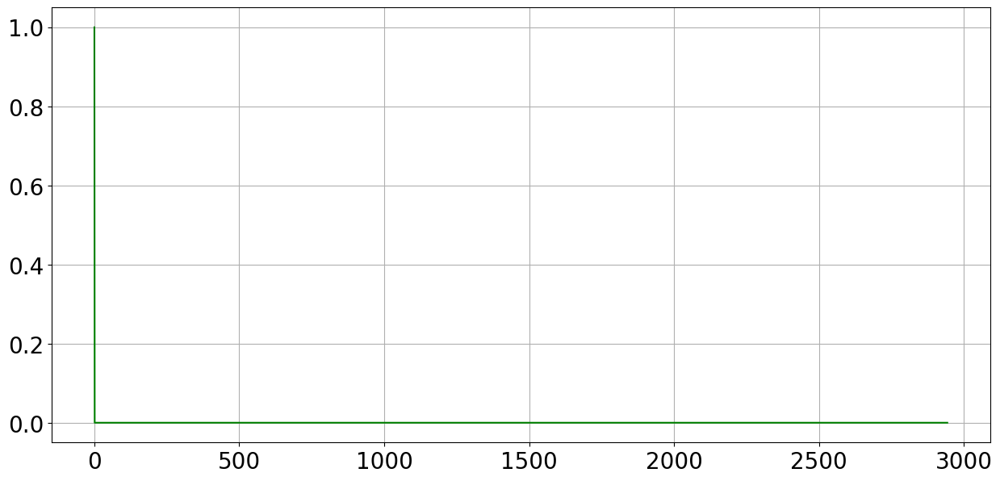

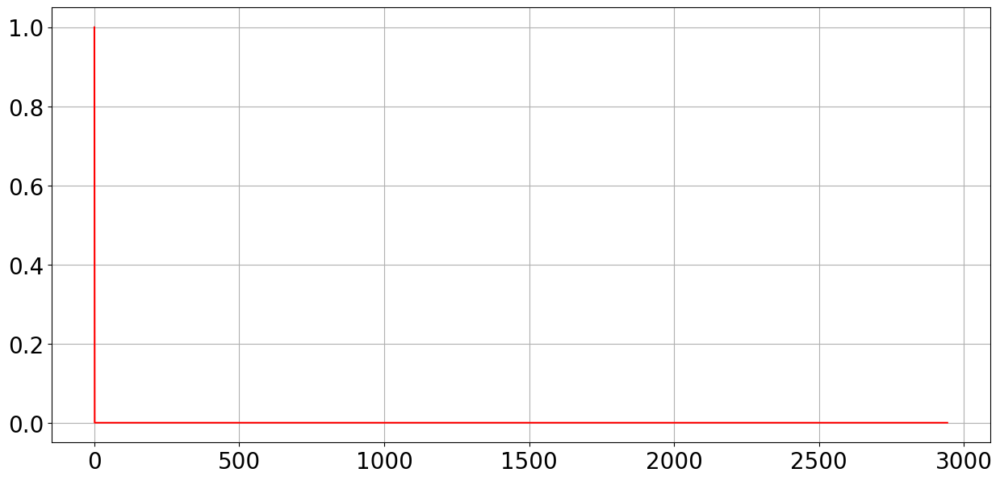

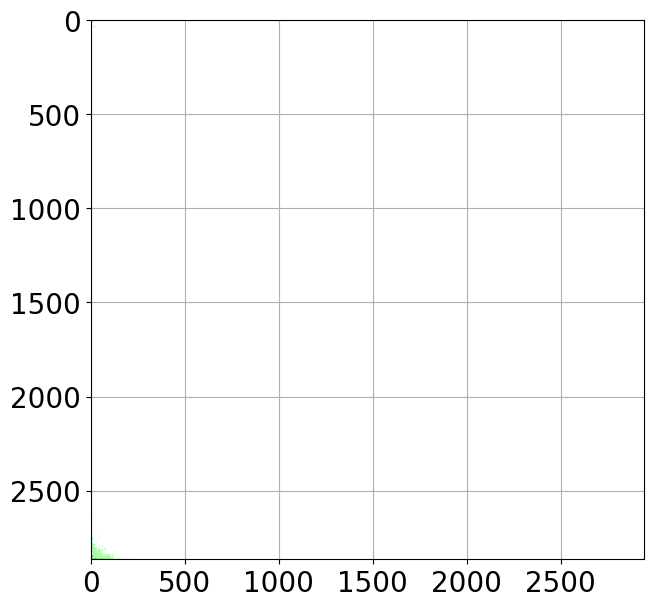

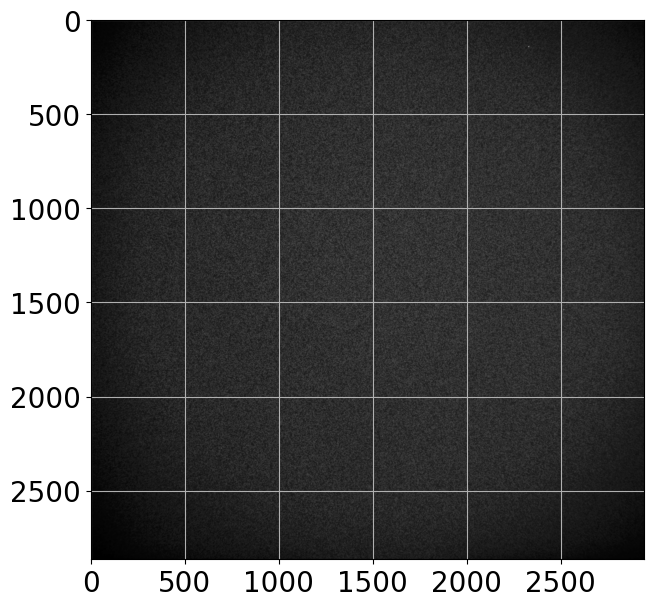

...

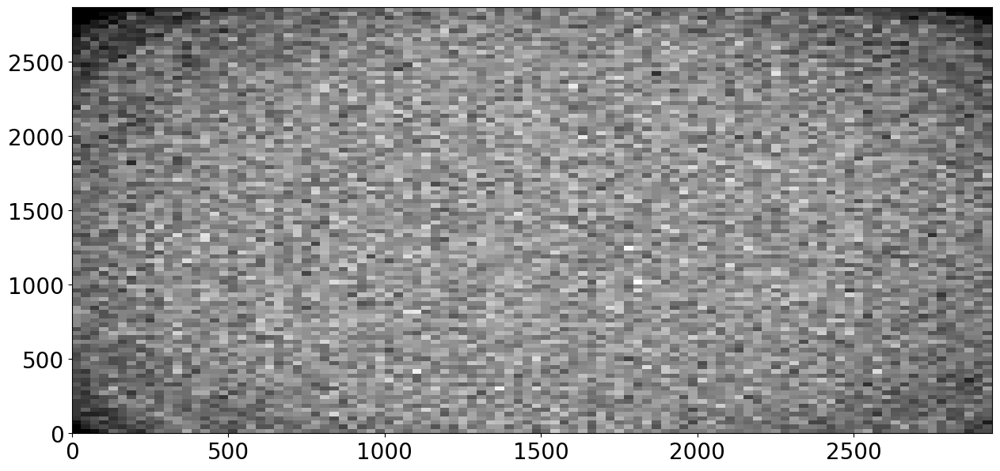

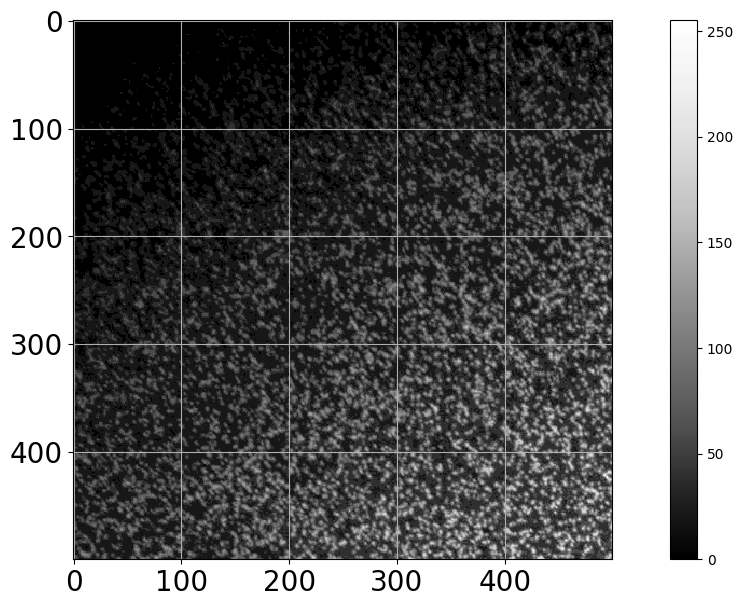

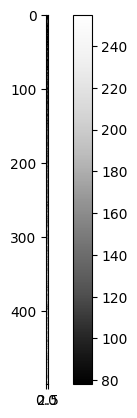

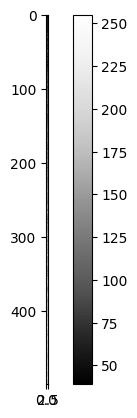

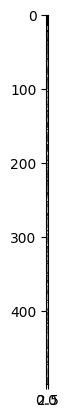

Bead 0 at position 1.0 17.5 499.0
Bead 1 at position 1.0000001192092896 18.09105110168457 485.0015869140625
Bead 2 at position 1.0 26.846153259277344 369.8461608886719
Bead 3 at position 1.0 28.570560455322266 435.9942626953125
Bead 4 at position 1.0 31.875398635864258 464.24920654296875
Bead 5 at position 1.0 33.0 388.75
Bead 6 at position 1.0 38.29432678222656 430.6748046875
Bead 7 at position 1.0 38.0 494.28570556640625
Bead 8 at position 0.9999999403953552 43.67941665649414 389.89434814453125
Bead 9 at position 1.0 43.38124465942383 427.3394775390625
Bead 10 at position 1.0 44.330509185791016 498.83050537109375
Bead 11 at position 1.0 45.961307525634766 419.31976318359375
Bead 12 at position 1.0 47.44374084472656 450.9140319824219
Bead 13 at position 1.0 53.71189880371094 432.0019836425781
Bead 14 at position 0.9999999403953552 54.58213424682617 471.9812316894531
Bead 15 at position 1.0 57.304962158203125 498.6680908203125
Bead 16 at position 1.0 61.598358154296875 492.639343261718

C:\Users\evgen\AppData\Local\Temp\ipykernel_53724\3736854375.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1,3)


Bead 22 at position 0.9868038296699524 77.28874969482422 365.9881286621094
Bead 23 at position 1.0 77.74036407470703 465.4020690917969
Bead 24 at position 1.0 77.70723724365234 242.86842346191406
Bead 25 at position 0.9877934455871582 77.19718170166016 452.36151123046875
Bead 26 at position 1.0 76.97581481933594 493.282958984375
Bead 27 at position 1.0 79.93415832519531 421.0152893066406
Bead 28 at position 1.0185768604278564 79.7229232788086 361.3287353515625
Bead 29 at position 1.011915683746338 82.01741790771484 452.4197998046875
Bead 30 at position 1.0 80.76660919189453 474.7876892089844
Bead 31 at position 1.0 79.13835144042969 486.091064453125
Bead 32 at position 1.0 84.45258331298828 432.18377685546875
Bead 33 at position 1.0 85.086669921875 346.48968505859375
Bead 34 at position 1.0 86.5895767211914 366.1502685546875
Bead 35 at position 1.0 89.90937042236328 496.202880859375
Bead 36 at position 1.0 89.19173431396484 450.34918212890625
Bead 37 at position 1.0 88.07978057861328 4

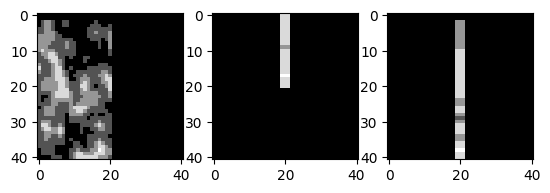

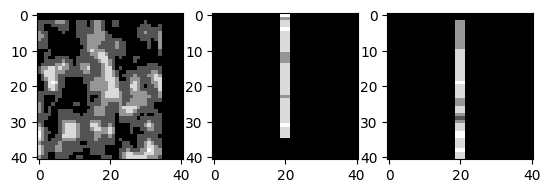

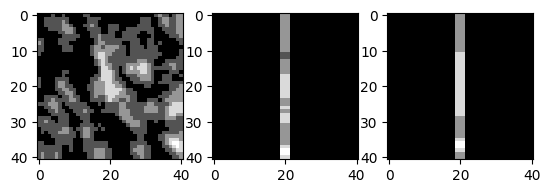

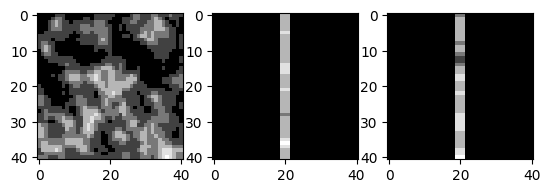

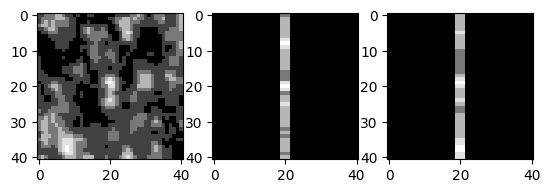

...

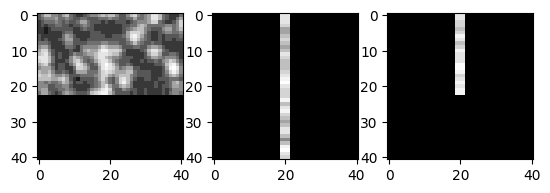

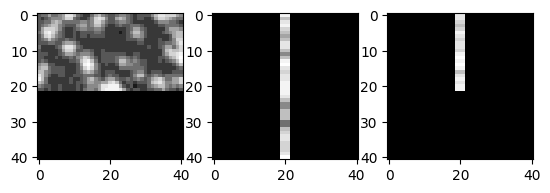

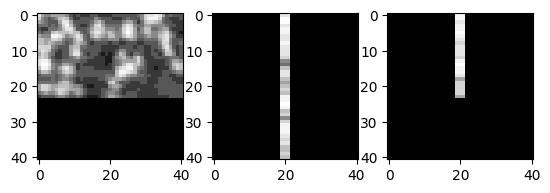

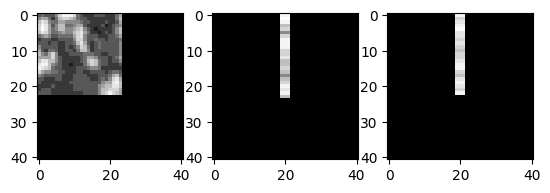

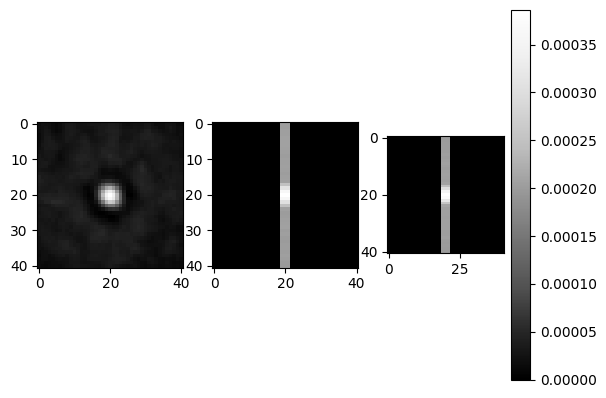

0.0 0.00038623708


In [1]:
#!/usr/bin/env python
# coding: utf-8

# In[8]:


from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
#from libtiff import TIFF
from skimage import io
#import pytiff
from tifffile import tifffile
#import OpenImageIO as oiio
#import rasterio
#import tensorflow_io as tfio
import cv2
import scipy
from skimage import color, data, restoration
from scipy.signal import convolve2d
import sporco
import skimage 
from scipy import ndimage
from skimage import measure
import matlab
import matlab.engine 
from wolframclient.evaluation import WolframLanguageSession
from wolframclient.language import wl
#import htmlPy
import eel
from skimage.metrics import structural_similarity
from skimage.metrics import mean_squared_error
from skimage import filters
from skimage.filters import try_all_threshold
from skimage import morphology
import pandas as pd
from pyclesperanto_prototype import imshow
import pyclesperanto_prototype as cle
from skimage.io import imread



def generate_feature_stack(image):
    # determine features
    blurred = filters.gaussian(image, sigma=2)
    edges = filters.sobel(blurred)

    # collect features in a stack
    # The ravel() function turns a nD image into a 1-D image.
    # We need to use it because scikit-learn expects values in a 1-D format here. 
    feature_stack = [
        image.ravel(),
        blurred.ravel(),
        edges.ravel()
    ]
    
    # return stack as numpy-array
    return np.asarray(feature_stack)

def adjust_gamma(image, gamma=1.0):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255
        for i in np.arange(0, 256)]).astype("uint8")

    return cv2.LUT(image, table)


def gamma_trans(img,gamma):
    # Конкретный метод сначала нормализуется до 1, а затем гамма используется в качестве значения индекса, чтобы найти новое значение пикселя, а затем восстановить
    gamma_table = [np.power(x/255.0,gamma)*255.0 for x in range(256)]
    gamma_table = np.round(np.array(gamma_table)).astype(np.uint8)
    # Реализация сопоставления использует функцию поиска в таблице Opencv
    return cv2.LUT(img0,gamma_table)


def laplacian_of_gaussian(image, sigma):
    """
    Applies a Gaussian kernel to an image and the Laplacian afterwards.
    """
    
    # blur the image using a Gaussian kernel
    intermediate_result = filters.gaussian(image, sigma)
    
    # apply the mexican hat filter (Laplacian)
    result = filters.laplace(intermediate_result)
    
    return result


def main():
    #image = cv2.imread("C:/Users/evgen/Downloads/s_1_1102_c.jpg",0)
    #image=imread("C:/Users/Евгений/Downloads/s_1_1102_c.tif")
    image = cv2.imread("C:/Users/evgen/Downloads/s_1_1102_c.jpg",0)
    image=np.asarray(image,dtype=np.uint8)
    #image=scipy.signal.wiener(image)
    print(image.shape)
    plt.figure(figsize=(15,7))
    plt.imshow(image,cmap='gray',vmax=image.max(),vmin=image.min())
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делений
    image= cv2.cvtColor(image,cv2.COLOR_GRAY2RGB)
    hsl=cv2.cvtColor(image,cv2.COLOR_RGB2HLS)
    hist = cv2.calcHist([hsl], [0], None, [hsl.shape[1]], [0, hsl.shape[1]])
    hist=hist/hist.sum()
    plt.figure(figsize=(15,7))
    
    plt.plot(hist.flatten(),'g')
    
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делений

    hsv=cv2.cvtColor(image,cv2.COLOR_RGB2HSV)
    
    hist = cv2.calcHist([hsv], [0], None, [hsv.shape[1]], [0, hsv.shape[1]])
    hist=hist/hist.sum()
    plt.figure(figsize=(15,7))
    
    plt.plot(hist.flatten(),'r')
    
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делений
    image=scipy.signal.wiener(image,noise=image.std())
    
    plt.figure(figsize=(15,7))
    plt.imshow(image,cmap='gray',vmax=image.max(),vmin=image.min())
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делений
    image=np.asarray(image,dtype=np.uint8)
    image=cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    plt.figure(figsize=(15,7))
    plt.imshow(image,cmap='gray')
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делений
    
    slp,hlp=sporco.signal.tikhonov_filter(image,2)
    plt.figure(figsize=(15,7))
    
    plt.imshow(slp,cmap = 'gray',vmax=slp.max(),vmin=slp.min())
    
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делений
    
    plt.figure(figsize=(15,7))
    
    plt.imshow(hlp,cmap = 'gray',vmax=hlp.max(),vmin=hlp.min())
    
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делений
    
    hlp=ndimage.median_filter(hlp, size=7)
    hlp=hlp<np.percentile(hlp, 95)

    plt.figure(figsize=(15,7))
    
    plt.imshow(hlp,cmap = 'gray',vmax=hlp.max(),vmin=hlp.min())
    
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делени
    
    hlp = filters.gaussian(hlp, sigma=1)
    plt.figure(figsize=(15,7))
    
    plt.imshow(hlp,cmap = 'gray')
    
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делени
    image1 = cv2.imread("C:/Users/evgen/Downloads/s_1_1102_c.jpg",0)
    #image1=imread("C:/Users/Евгений/Downloads/s_1_1102_c.tif")
    image1=np.asarray(image1,dtype=np.uint8)
    image2 = cv2.imread("C:/Users/evgen/Downloads/s_1_1101_a.jpg",0)
    #image2=imread("C:/Users/Евгений/Downloads/s_1_1102_a.tif")
    image2=np.asarray(image2,dtype=np.uint8)
    mse = mean_squared_error(hlp, image2)
    ssim = structural_similarity(hlp, image2, data_range=image2.max() - image2.min())
    print(mse)
    print(ssim)
    eng = matlab.engine.start_matlab()   
    r=eng.corr2(hlp,image2)
    hlp=hlp-hlp.mean()-r*image2
    
    
    hlpfilt=np.asarray(hlp,dtype=np.uint8)
    plt.figure(figsize=(15,7))
    
    plt.imshow(hlpfilt,cmap = 'gray',vmax=hlpfilt.max(),vmin=hlpfilt.min())
    
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делени
    #hlpfilt = eng.imadjust(hlpfilt,eng.stretchlim(hlpfilt),[])
    hlpfilt=eng.imadjust(hlpfilt)
    hlpfilt=np.asarray(hlpfilt,dtype=np.uint8)
    hlpfilt=cv2.cvtColor(hlpfilt,cv2.COLOR_GRAY2RGB)
    #hlp=scipy.ndimage.percentile_filter(hlp,95)
    
    cv2.imwrite("C:/Users/evgen/Downloads/s_1_1102_cfilt.jpg",hlpfilt)
    #cv2.imwrite("C:/Users/Евгений/Downloads/s_1_1102_cfilt.jpg",hlpfilt)
    r=eng.normxcorr2(hlp,image2)
    r=np.asarray(r,dtype=np.uint8)
    print(r.shape)
    r=cv2.cvtColor(r, cv2.COLOR_GRAY2BGR) 
    cv2.imwrite("C:/Users/evgen/Downloads/s_1_1102_c_a_normxcorr2.jpg",r)
    #cv2.imwrite("C:/Users/Евгений/Downloads/s_1_1102_c_a_normxcorr2.jpg",r)
    plt.figure(figsize=(15,7))
    
    plt.imshow(hlpfilt,cmap = 'gray',vmax=hlpfilt.max(),vmin=hlpfilt.min())
    
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делени
    
    edges = cv2.Canny(image=hlpfilt, threshold1=1, threshold2=2)
    plt.figure(figsize=(15,7))
    
    plt.imshow(edges,cmap = 'gray',vmax=edges.max(),vmin=edges.min())
    
    plt.grid(True)
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делений
    r=cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)
    cv2.imwrite("C:/Users/evgen/Downloads/s_1_1102_c_edges.jpg",r)
    #cv2.imwrite("C:/Users/Евгений/Downloads/s_1_1102_c_edges.jpg",r)
    ret, thresh = cv2.threshold(edges, 1, 2, 0)
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    print('Координаты центра')
    xcentr=[]
    ycentr=[]
    
    for i in contours:
        M = cv2.moments(i)
        if M['m00'] != 0:
            
            cx = int(M['m10']/M['m00'])
            cy = int(M['m01']/M['m00'])
            xcentr.append(cx)
            ycentr.append(cy)
            #print(f"x: {cx} y: {cy}")
            
    print('Количество')
    print(len(xcentr))
    print()
    
    plt.figure(figsize=(15,7))
    plt.hist2d(xcentr, ycentr,bins = 100, cmap ="gray")
    plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делений
    
    
 
    isClosed = True
    image3=np.zeros((image1.shape[0],image1.shape[1],3))

    color = (255, 255, 255)
    image=np.asarray(image,dtype=np.uint8)
    # Line thickness of 5 px
    thickness = 5
 
    # Using cv2.polylines() method


    image4 = cv2.polylines(image3, contours,
                      isClosed, color, thickness)
    
    cv2.imwrite("C:/Users/evgen/Downloads/s_1_1102_c_contours.jpg",image4)
    
    #psf
    image=hlpfilt[0:500,0:500]
    print(image.shape)
    try:
        plt.figure(figsize=(15,7))
        plt.imshow(image,cmap='gray',vmax=image.max(),vmin=image.min())
        plt.grid(True)
        plt.tick_params(labelsize =20,#  Размер подписи
                    color = 'k')   #  Цвет делений
        imshow(cle.maximum_x_projection(image), colorbar=True)
        imshow(cle.maximum_y_projection(image), colorbar=True)
        imshow(cle.maximum_z_projection(image), colorbar=True)
    except:
        pass
    try:
       # Segment objects
        label_image = cle.voronoi_otsu_labeling(image)
        imshow(label_image, labels=True)
    
        # determine center of mass for each object
    
        stats = cle.statistics_of_labelled_pixels(image, label_image)
        df = pd.DataFrame(stats)
        df[["mass_center_x", "mass_center_y", "mass_center_z"]]
    

        # configure size of future PSF image
        psf_radius = 20
        size = psf_radius * 2 + 1

        # initialize PSF
        single_psf_image = cle.create([size, size, size])
        avg_psf_image = cle.create([size, size, size])

        num_psfs = len(df)
        for index, row in df.iterrows():
            x = row["mass_center_x"]
            y = row["mass_center_y"]
            z = row["mass_center_z"]
    
            print("Bead", index, "at position", x, y, z)
    
            # move PSF in right position in a smaller image
            cle.translate(image, single_psf_image, 
                  translate_x= -x + psf_radius,
                  translate_y= -y + psf_radius,
                  translate_z= -z + psf_radius)

            # visualize
            fig, axs = plt.subplots(1,3)
            imshow(cle.maximum_x_projection(single_psf_image), plot=axs[0])
            imshow(cle.maximum_y_projection(single_psf_image), plot=axs[1])
            imshow(cle.maximum_z_projection(single_psf_image), plot=axs[2])
            # average
            avg_psf_image = avg_psf_image + single_psf_image / num_psfs
        
        
        fig, axs = plt.subplots(1,3)    
        imshow(cle.maximum_x_projection(avg_psf_image), plot=axs[0])
        imshow(cle.maximum_y_projection(avg_psf_image), plot=axs[1])
        imshow(cle.maximum_z_projection(avg_psf_image), plot=axs[2])
    
        print(avg_psf_image.min(), avg_psf_image.max())
    
    
        normalized_psf = avg_psf_image / np.sum(avg_psf_image)

        imshow(normalized_psf, colorbar=True)
        print(normalized_psf.min(), normalized_psf.max())
    except:
        pass
 
    
    
    plt.show()
    
    
        
    
    
if __name__ == "__main__":
    main()